# ノイズデータ作成
- gen_gap_noise() のtimestamps の開始点修正

In [1]:
DEBUG = True
#DEBUG = False

OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/tmp_noise"
#OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex006_generating_noise_gap"
IS_DEL_OUTDIR = True

#TMP_OUTDIR = "my_generating_noise_1"
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_noise_2"

GAP_N_LEN = 200

In [2]:
# Parameters
TMP_OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/PyFstat_tmp_files/my_generating_noise_2"
OUTDIR = "/volume/kaggle/g2net2/pyfstat_output/ex006_generating_noise_gap1400"
GAP_N_LEN = 1400
IS_DEL_OUTDIR = True
DEBUG = False


In [3]:
#!pip install h5py
#!pip install pandas
import h5py
import pandas as pd

In [4]:
import os
import glob
import shutil
import numpy as np
from tqdm.notebook import tqdm
from scipy import stats

import pyfstat
from pyfstat.utils import get_sft_as_arrays

# Local module to simplify plotting
import tutorial_utils

logger = pyfstat.set_up_logger(label=TMP_OUTDIR, log_level="INFO")

%matplotlib inline

22-11-26 16:18:01.391 pyfstat INFO    : Running PyFstat version 1.18.1+84.5ded4a67.clean
22-11-26 16:18:01.459 pyfstat.utils.importing INFO    : No $DISPLAY environment variable found, so importing matplotlib.pyplot with non-interactive 'Agg' backend.


In [5]:
# ================================================
# 生成したhdf5ファイルロードできるか確認
# ================================================
import h5py
from pathlib import Path

def load_hdf5(h_path):
    """hdf5ファイルロード"""
    with h5py.File(h_path, 'r') as f:
        g = f[file_id]

        # [:]を最後につけないと取り出せないので注意
        freq = g['frequency_Hz'][:]  # shape: (360,) 各振動数

        h1_a = g["H1"]['SFTs'][:]
        h1_t = g["H1"]['timestamps_GPS'][:]

        l1_a = g["L1"]['SFTs'][:]
        l1_t = g["L1"]['timestamps_GPS'][:]
    
    return freq, h1_a, l1_a, h1_t, l1_t

# gen_non_stationary_noise

In [6]:
def gen_non_stationary_noise(out_path, file_id, F0, min_sqrtSX=1e-24, n_segment=10):
    """非定常ノイズデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常のsegmentと併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": TMP_OUTDIR,
        "duration": 30 * 4 * 24 * 3600,  #5 * 86400,  # 継続時間[秒］。4ヶ月
        "detectors": "H1,L1",  # シミュレーションする検出器(ここではLIGOハンフォード)
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112
        
        # 関係ないと思うが一応時刻もランダムに変えとく
        "tstart": np.random.randint(1238166018,1248724262),  # 観測開始時刻 [GPS時刻]

        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # めちゃくちゃ中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists(TMP_OUTDIR):
        shutil.rmtree(TMP_OUTDIR)
        os.mkdir(TMP_OUTDIR)
    
    # =================================================
    # 非定常なノイズにするため振幅の強さランダムに変える
    # =================================================
    segment_sqrtSX = []
    for segment in range(n_segment):
        # とりあえず4倍まで変える
        r = np.random.randint(1,4+1) + np.random.rand()
        segment_sqrtSX.append( min_sqrtSX*r ) 
    
    # =================================================
    # 継続時間[秒］変更するduration
    # =================================================
    duration_MAX = writer_kwargs["duration"]
    segment_idxs = sorted(np.random.choice(list(range(5760)), n_segment, replace=False)) # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    segment_lengths = [segment_idxs[0]*1800]
    for i in range(1, n_segment):
        segment_lengths.append( segment_idxs[i]*1800 - segment_idxs[i - 1]*1800 )  
    segment_lengths.append( duration_MAX - segment_idxs[-1]*1800 )
    #print("segment_lengths:", sum(segment_lengths)/(24 * 3600), segment_lengths)
    
    # =================================================
    # duration単位でデータ生成
    # =================================================
    sft_path = []  # リストにsftファイルを詰めて";"で連結したら1ファイルで出力可能
    for segment in range(n_segment):
        # パラメータ変更
        writer_kwargs["label"] = f"segment_{segment}"
        writer_kwargs["duration"] = segment_lengths[segment]
        writer_kwargs["sqrtSX"] = segment_sqrtSX[segment]
        
        # 観測開始時刻 [GPS時刻] をずらす
        if segment > 0:
            writer_kwargs["tstart"] += writer_kwargs["Tsft"] + segment_lengths[segment - 1]
    
        # データ生成
        writer = pyfstat.Writer(**writer_kwargs)
        writer.make_data()
        
        # sftファイルをリストに詰める
        sft_path.append(writer.sftfilepath)
    
    sft_path = ";".join(sft_path)  # ; で異なるファイルを結合
    frequency, timestamps, fourier_data = get_sft_as_arrays(sft_path)  # SFTデータをnumpyの配列に読み込み
    
    # =================================================
    # 対象の周波数帯域の 0.2 の範囲だけスライス
    # =================================================
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
    first_index = np.argmin( np.abs( frequency - writer_kwargs["F0"] ) )
    last_index = np.argmin( np.abs( frequency - (writer_kwargs["F0"] + 0.2) ) )
    frequency = frequency[first_index:last_index+1]
    h1_amp = fourier_data["H1"][first_index:last_index + 1, :]
    l1_amp = fourier_data["L1"][first_index:last_index + 1, :]
    
    # 360の長さまでにしておく（361になるときがあるので）
    frequency = frequency[:360]
    h1_amp = h1_amp[:360,:]
    l1_amp = l1_amp[:360,:]
    
    # =================================================
    # HDF5ファイルの作成
    # =================================================
    print(timestamps["H1"])
    # segmentアリだと4096未満になるときあるので対策する
    if (len(timestamps["H1"]) >= 4096) and (len(timestamps["L1"]) >= 4096):
                                                           
        with h5py.File(f"{out_path}", "w") as h5:
            g = h5.create_group(str(file_id))
            g.create_dataset('frequency_Hz', data=frequency)

            g_h = g.create_group("H1")
            g_h.create_dataset('SFTs', data=h1_amp)
            g_h.create_dataset('timestamps_GPS', data=timestamps["H1"])

            g_l = g.create_group("L1")
            g_l.create_dataset('SFTs', data=l1_amp)
            g_l.create_dataset('timestamps_GPS', data=timestamps["L1"])
    
    return frequency, timestamps["H1"], timestamps["L1"], h1_amp, l1_amp

# gen_gap_noise

In [7]:
def gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, detectors):
    """detectors指定してgapノイズデータを生成
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # Setup Writer
    writer_kwargs = {
        "outdir": TMP_OUTDIR,
        #"duration": 30 * 4 * 24 * 3600,  #5 * 86400,  # 継続時間[秒］。4ヶ月

        "detectors": detectors,  # シミュレーションする検出器(ここではLIGOハンフォード)
        
        "Tsft": 1800,  # フーリエ変換の継続時間
        "SFTWindowType": "tukey",  # 短時間フーリエ変換を計算するための窓関数
        "SFTWindowBeta": 0.01,  # 窓関数に関連するパラメータ。0.01, 0.001 どちらでも変わらんらしい(https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#2003112

        ## 関係ないと思うが一応時刻もランダムに変えとく
        #"tstart": np.random.randint(1238166018,1248724262),  # 観測開始時刻 [GPS時刻]
        
        "sqrtSX": sqrtSX,  # 雑音の片側振幅スペクトル密度
        
        # コンペデータの振動数の範囲内でバンドの中心周波数ランダムに変える
        "F0": F0,  # 生成するバンドの中心周波数 [Hz]. [F0 - Band/2, F0 + Band/2]
        "Band": 0.5,  # F0付近の周波数帯域幅 [Hz]
    }
    
    # =================================================
    # 中間ファイル作られるから実行前にきれいにする
    # =================================================
    if os.path.exists(TMP_OUTDIR):
        shutil.rmtree(TMP_OUTDIR)
        os.mkdir(TMP_OUTDIR)
    
    # =================================================
    # 各 GPS タイムスタンプのリスト。リストの要素間の飛びの時間はデータが存在しない「ギャップ」になる
    # =================================================
    max_gap_sec = (4*30 - 81) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最小は81日間
    #min_gap_sec = (4*30 - 101) * 24 * 3600  # 取り得るgapの全時間sec。test setのデータある観測時間の最大は101日間    
    gap_sum = 0
    if detectors == "H1":
        # h1のタイムスタンプの数
        n_idxs = np.random.randint(4281, 4887+1)  # test setのタイムスタンプの数より
        timestamps = [ np.random.randint(1238166018, 1238240175) ]  # 観測開始時刻 [GPS時刻]
    else:
        # l1のタイムスタンプの数
        n_idxs = np.random.randint(4297, 4878+1)  # test setのタイムスタンプの数より
        timestamps = [ np.random.randint(1238166019, 1238222656) ]  # 観測開始時刻 [GPS時刻]
    #for idx in range(5760): # 5760(=4*30*24*3600/1800)タイムスタンプの最大長さ
    for idx in range(n_idxs):
        # prob_gapの確率でgap入れる
        if ( np.random.rand() > 1 - prob_gap ) and ( gap_sum+1 < max_gap_sec ):
            # 最低1秒gapありとした
            # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/358835#2026499
            inteval = np.random.randint(1, 105026+1)  # test setのgapの最大は105026sec
            gap_sum += inteval
        else:
            inteval = 1800
        timestamps += [timestamps[-1] + inteval]
    #print("timestamps:", list( np.array(timestamps[1:])-np.array(timestamps[:-1]) ))
    writer_kwargs["timestamps"] = np.array(timestamps)
    
    # =================================================
    # データ生成
    # =================================================
    # Create SFTs
    writer = pyfstat.Writer(**writer_kwargs)
    writer.make_data()
    
    # SFTデータをnumpyの配列に読み込み
    frequency, timestamps, fourier_data = get_sft_as_arrays(writer.sftfilepath)
    
    return frequency, timestamps, fourier_data


def gen_gap_noise(out_path, file_id, sqrtSX, F0, prob_gap=0.01):
    """gapノイズデータを生成してhdf5に保存する
    gapノイズ(timestamps)は非定常の duration, tstart と併用できなかった
    """
    
    # h1とl1で異なるgapにするためにそれぞれでデータ生成
    frequency, timestamps_h1, fourier_data_h1 = gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, "H1")
    frequency, timestamps_l1, fourier_data_l1 = gen_gap_noise_detectors(out_path, file_id, sqrtSX, F0, prob_gap, "L1")
    
    # =================================================
    # 対象の周波数帯域の 0.2 の範囲だけスライス
    # =================================================
    # https://www.kaggle.com/competitions/g2net-detecting-continuous-gravitational-waves/discussion/347052#1987496
    first_index = np.argmin( np.abs( frequency - F0 ) )
    last_index = np.argmin( np.abs( frequency - (F0 + 0.2) ) )
    frequency = frequency[first_index:last_index+1]
    h1_amp = fourier_data_h1["H1"][first_index:last_index + 1, :]
    l1_amp = fourier_data_l1["L1"][first_index:last_index + 1, :]
    
    # 360の長さまでにしておく（361になるときがあるので）
    frequency = frequency[:360]
    h1_amp = h1_amp[:360,:]
    l1_amp = l1_amp[:360,:]
    
    # =================================================
    # HDF5ファイルの作成
    # =================================================
    with h5py.File(f"{out_path}", "w") as h5:
        g = h5.create_group(str(file_id))
        g.create_dataset('frequency_Hz', data=frequency)
        
        g_h = g.create_group("H1")
        g_h.create_dataset('SFTs', data=h1_amp)
        g_h.create_dataset('timestamps_GPS', data=timestamps_h1["H1"])
        
        g_l = g.create_group("L1")
        g_l.create_dataset('SFTs', data=l1_amp)
        g_l.create_dataset('timestamps_GPS', data=timestamps_l1["L1"])
    
    return frequency, timestamps_h1["H1"], timestamps_l1["L1"], h1_amp, l1_amp

# Main

In [8]:
# ================================================
# hdf5ファイル生成
# ================================================
def main(debug=True):
        
    def _gen_gap_noise(min_sqrtSX, max_sqrtSX, n_len, start_id=0):
        for i in range(n_len):
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            _sqrtSX = '{:.3g}'.format(sqrtSX)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_gap"
            out_path = f"{OUTDIR}/{file_id}.hdf5"

            frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_gap_noise(out_path, str(file_id), sqrtSX, F0)
            
    def _gen_non_stationary_noise(min_sqrtSX, max_sqrtSX, n_len, start_id=0):
        for i in tqdm(range(n_len)):
            F0 = np.random.randint(50,500) + np.random.rand()
            
            _n_max = int((max_sqrtSX - min_sqrtSX) / min_sqrtSX) + 1
            sqrtSX = np.random.randint(1,_n_max) * min_sqrtSX
            
            n_segment = np.random.randint(5,20)

            _sqrtSX = '{:.3g}'.format(sqrtSX)
            file_id = f"{start_id + i}_sqrtSX{_sqrtSX}_F0{str(round(F0,2))}_segment{n_segment}"
            out_path = f"{OUTDIR}/{file_id}.hdf5"
            #print(out_path)

            for _ in range(10):
                frequency, h1_ts, l1_ts, h1_amp, l1_amp = gen_non_stationary_noise(out_path, file_id, F0, min_sqrtSX=sqrtSX, n_segment=n_segment)
                # segmentアリだと4096未満になるときあるので対策する
                if (len(h1_ts) >= 4096) and (len(l1_ts) >= 4096):
                    break
    
    if debug:
        gen_n_len = 1 
        #NON_STAT_N_LEN = 1
    else:
        gen_n_len = GAP_N_LEN
        #NON_STAT_N_LEN = gen_n_len // 4

    
    # 振幅の桁数変えたgap_noise
    _gen_gap_noise(5e-24, 2e-22, gen_n_len, start_id=0)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    
    ## 振幅の桁数変えたnon_stationary_noise
    #_gen_non_stationary_noise(5e-24, 2e-22, NON_STAT_N_LEN, start_id=gen_n_len)  # ex002の結果からtestのH1,L1はこれぐらいのオーダー感
    
    
if __name__ == '__main__':

    if IS_DEL_OUTDIR:
        if os.path.exists(OUTDIR):
            shutil.rmtree(OUTDIR)
    os.makedirs(f"{OUTDIR}", exist_ok=True)
        
    main(debug=DEBUG)
    

from IPython.display import clear_output  # セルの出力削除（ログあると重すぎるので消す)
clear_output()

non_stationary_noiseは途中で失敗する

In [6]:
_df = pd.DataFrame({"id": [Path(p).stem for p in sorted(glob.glob(f"{OUTDIR}/*.hdf5"))], "target": 0})
_df.to_csv(OUTDIR + "/df.csv", index=False)

fmins, fmaxs = [], []
h1_hsizes, h1_wsizes = [], []
l1_hsizes, l1_wsizes = [], []
h1_amp_mins, h1_amp_maxs = [], []
l1_amp_mins, l1_amp_maxs = [], []
h1_tmins, h1_tmaxs = [], []
l1_tmins, l1_tmaxs = [], []
h1_max_intevals, l1_max_intevals = [], []
for _id in tqdm( _df["id"].to_numpy() ):
    h_path = f"{OUTDIR}/{_id}.hdf5"
    file_id = Path(h_path).stem
    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    
    fmins.append(freq.min())
    fmaxs.append(freq.max())
    
    h1_hsizes.append(h1_a.shape[0])
    h1_wsizes.append(h1_a.shape[1])
    
    l1_hsizes.append(l1_a.shape[0])
    l1_wsizes.append(l1_a.shape[1])
    
    h1_amp_mins.append(h1_a.min())
    h1_amp_maxs.append(h1_a.max())
    
    l1_amp_mins.append(l1_a.min())
    l1_amp_maxs.append(l1_a.max())

    h1_tmins.append(h1_t.min())
    h1_tmaxs.append(h1_t.max())
    
    l1_tmins.append(l1_t.min())
    l1_tmaxs.append(l1_t.max())
    
    h1_max_inteval = np.max(h1_t[1:]-h1_t[0:-1])
    l1_max_inteval = np.max(l1_t[1:]-l1_t[0:-1])
    h1_max_intevals.append(h1_max_inteval)
    l1_max_intevals.append(l1_max_inteval)

_df["freq min"] = fmins
_df["freq max"] = fmaxs
_df["H1 SFTs h"] = h1_hsizes
_df["H1 SFTs w"] = h1_wsizes
_df["H1 time min"] = h1_tmins
_df["H1 time max"] = h1_tmaxs
_df["H1 max inteval"] = h1_max_intevals
_df["L1 SFTs h"] = l1_hsizes
_df["L1 SFTs w"] = l1_wsizes
_df["L1 time min"] = l1_tmins
_df["L1 time max"] = l1_tmaxs
_df["L1 max inteval"] = l1_max_intevals
_df["freq_min//10"] = _df["freq min"]//10
_df["freq_min//10_target"] = _df["freq_min//10"].astype(str) + "_" + _df["target"].astype(str)
    
_df.to_csv(OUTDIR + "/df_summary.csv", index=False)
_df

  0%|          | 0/1400 [00:00<?, ?it/s]

,id,target,freq min,freq max,H1 SFTs h,H1 SFTs w,H1 time min,H1 time max,H1 max inteval,L1 SFTs h,L1 SFTs w,L1 time min,L1 time max,L1 max inteval,freq_min//10,freq_min//10_target
0,0_sqrtSX1.95e-22_F0482.46_gap,0,482.461111,482.660556,360,4409,1238230851,1248737448,104113,360,4370,1238196797,1247770616,99109,48.0,48.0_0
1,1000_sqrtSX1.4e-22_F076.19_gap,0,76.191111,76.390556,360,4359,1238169249,1247590346,96552,360,4691,1238189574,1249303090,104679,7.0,7.0_0
2,1001_sqrtSX1.6e-22_F0327.4_gap,0,327.395556,327.595000,360,4840,1238187307,1249773321,103077,360,4672,1238206141,1248387697,104267,32.0,32.0_0
3,1002_sqrtSX1.2e-22_F058.62_gap,0,58.618889,58.818333,360,4634,1238207581,1249069922,105022,360,4830,1238195790,1249196894,104512,5.0,5.0_0
4,1003_sqrtSX8.5e-23_F0454.1_gap,0,454.096111,454.295556,360,4844,1238193883,1249152197,99094,360,4403,1238170400,1248675928,102101,45.0,45.0_0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1395,997_sqrtSX2e-23_F0216.15_gap,0,216.151667,216.351111,360,4346,1238179042,1248847174,103410,360,4694,1238171301,1249112492,105006,21.0,21.0_0
1396,998_sqrtSX1.2e-22_F078.09_gap,0,78.094444,78.293889,360,4598,1238210437,1248393356,97143,360,4407,1238217050,1248518865,100262,7.0,7.0_0
1397,999_sqrtSX1.8e-22_F0298.19_gap,0,298.193333,298.392778,360,4672,1238172341,1249357711,104488,360,4839,1238211540,1249248009,103173,29.0,29.0_0
1398,99_sqrtSX5.5e-23_F0376.57_gap,0,376.572778,376.772222,360,4844,1238218097,1249361665,105024,360,4349,1238210752,1247950823,97509,37.0,37.0_0


# Check

(360,)
(360, 4409) (360, 4370)
(4409,) (4370,)
h1_t: [1238230851 1238232651 1238234451 ... 1248733848 1248735648 1248737448]
l1_t: [1238196797 1238198597 1238200397 ... 1247767016 1247768816 1247770616]
h1_t[0] - l1_t[0]: 34054
h1 sum gap: 29.77 days
l1 sum gap: 19.79 days
(360,)
(360, 4359) (360, 4691)
(4359,) (4691,)
h1_t: [1238169249 1238171049 1238172849 ... 1247586746 1247588546 1247590346]
l1_t: [1238189574 1238191374 1238193174 ... 1249299490 1249301290 1249303090]
h1_t[0] - l1_t[0]: -20325
h1 sum gap: 18.25 days
l1 sum gap: 30.92 days
(360,)
(360, 4840) (360, 4672)
(4840,) (4672,)
h1_t: [1238187307 1238189107 1238190907 ... 1249769721 1249771521 1249773321]
l1_t: [1238206141 1238207941 1238209741 ... 1248384097 1248385897 1248387697]
h1_t[0] - l1_t[0]: -18834
h1 sum gap: 33.28 days
l1 sum gap: 20.53 days
(360,)
(360, 4634) (360, 4830)
(4634,) (4830,)
h1_t: [1238207581 1238209381 1238211181 ... 1249066322 1249068122 1249069922]
l1_t: [1238195790 1238197590 1238199390 ... 1249193

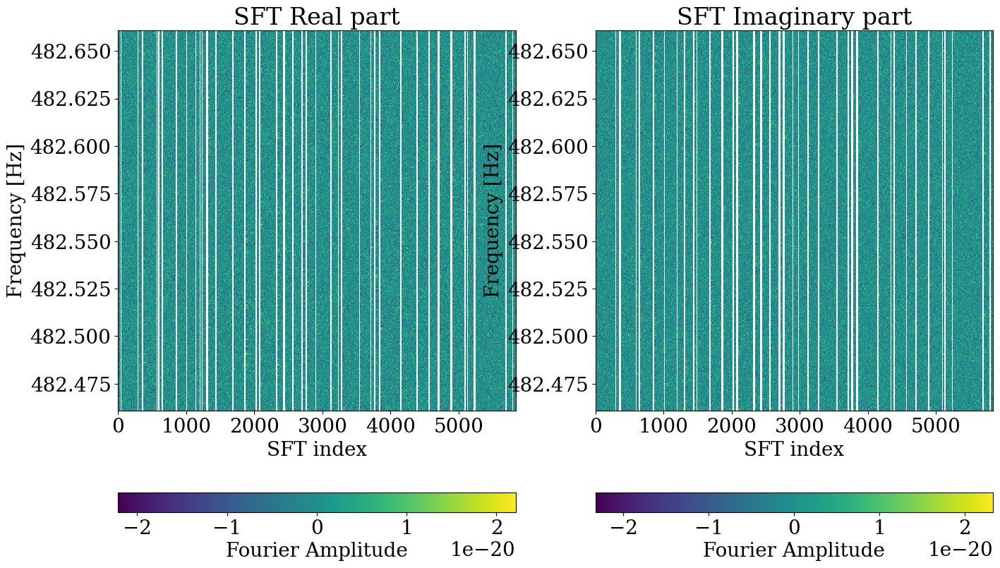

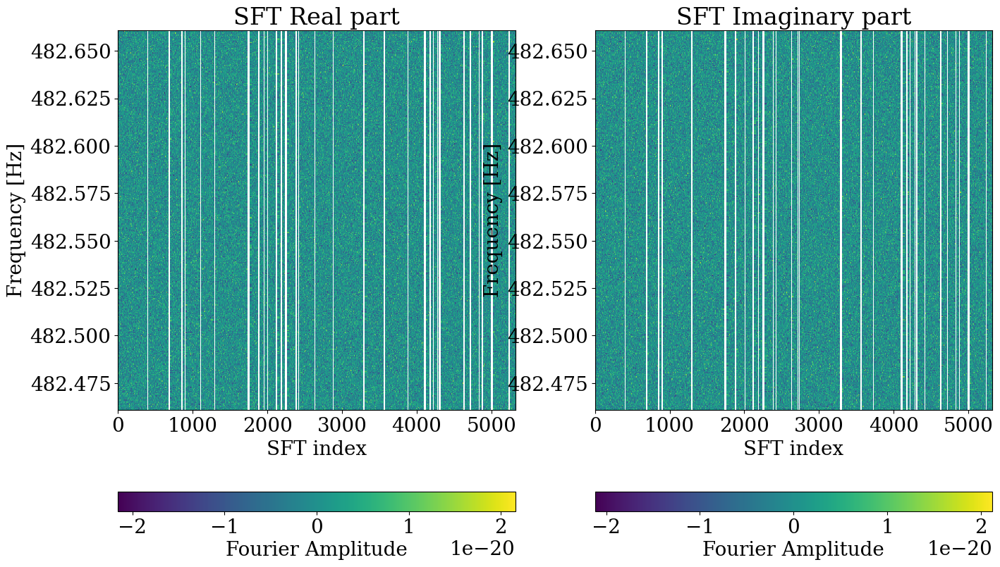

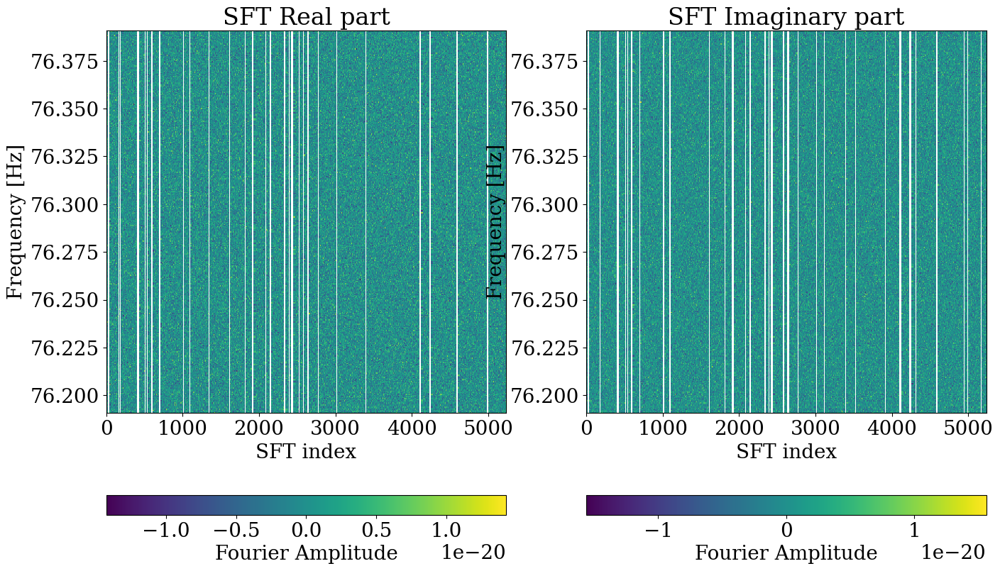

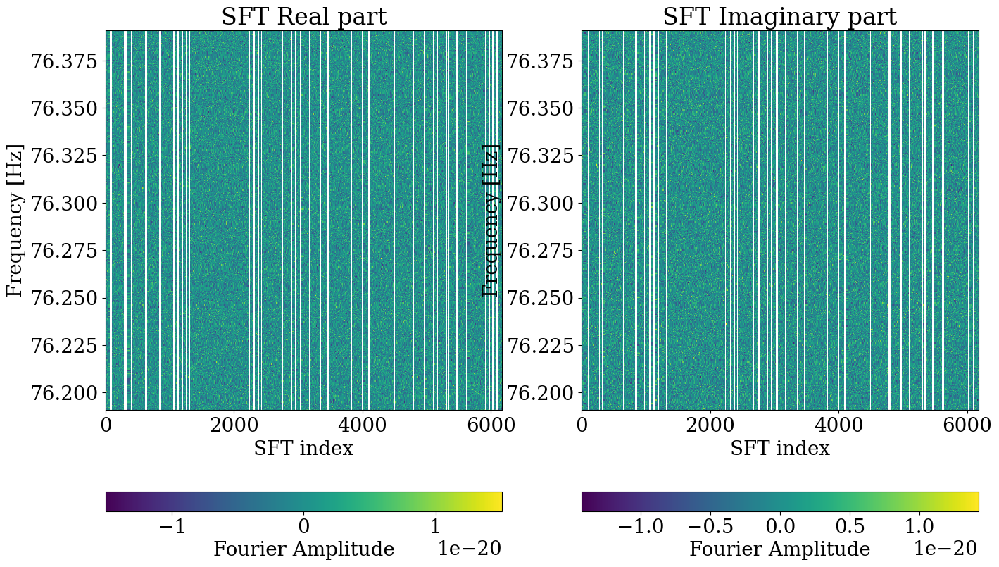

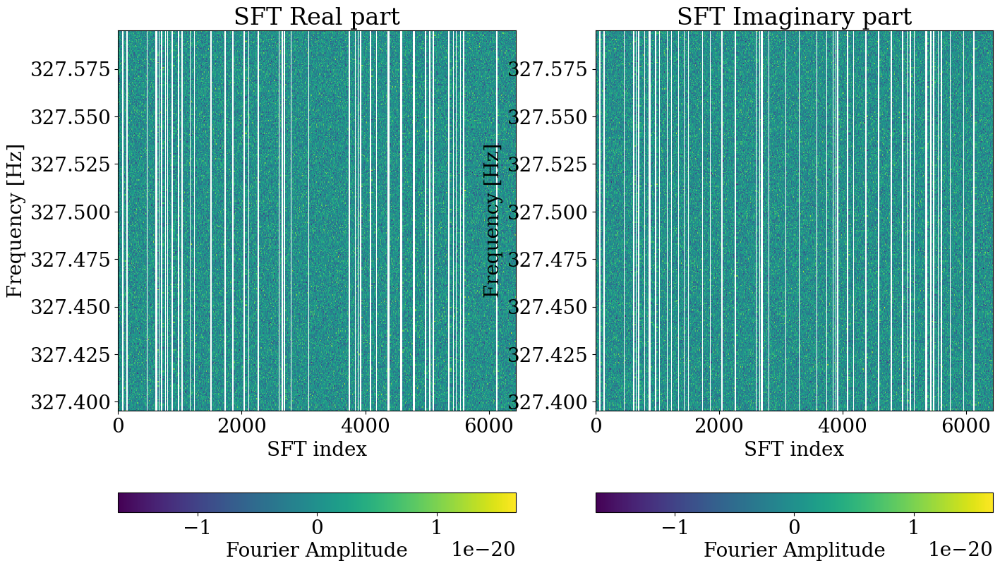

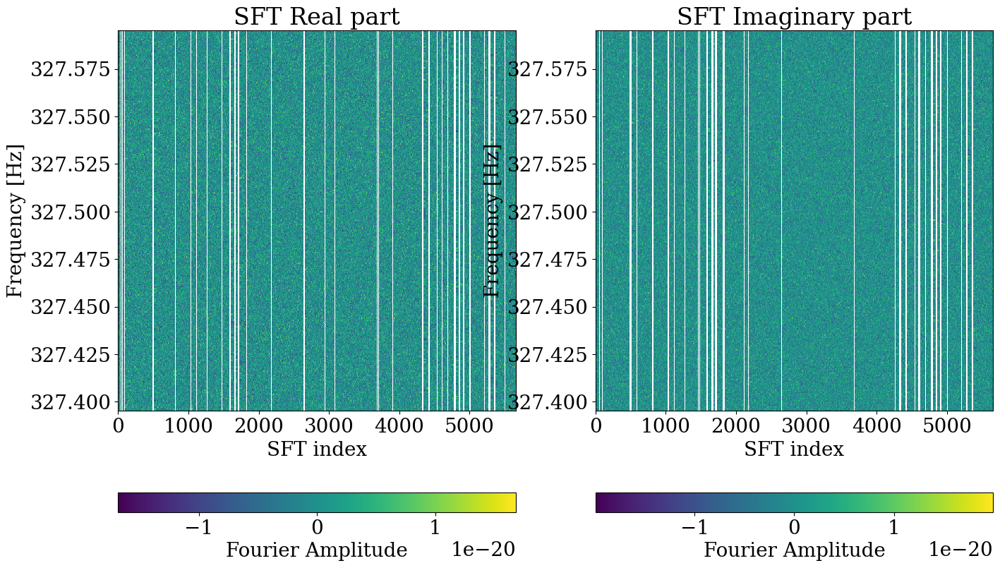

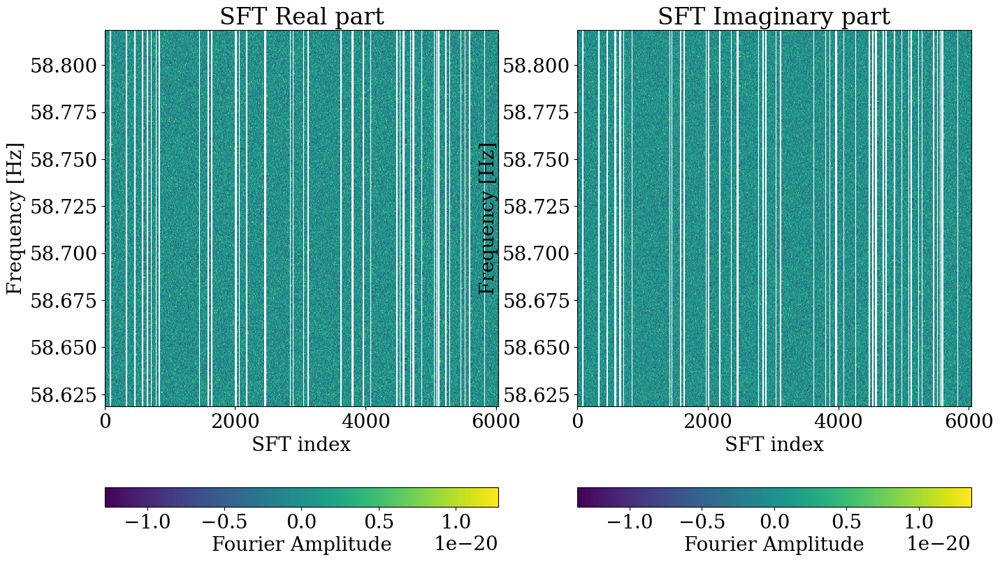

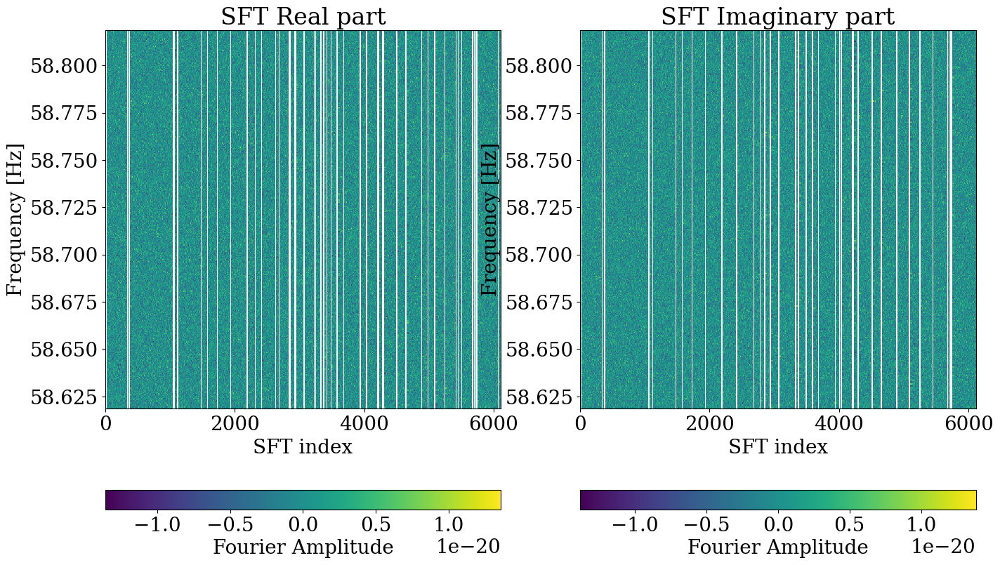

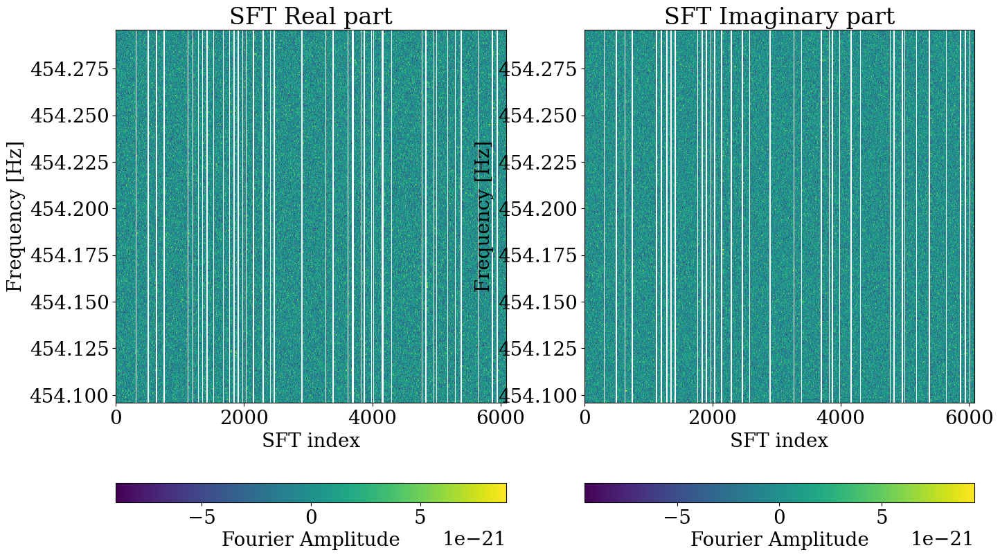

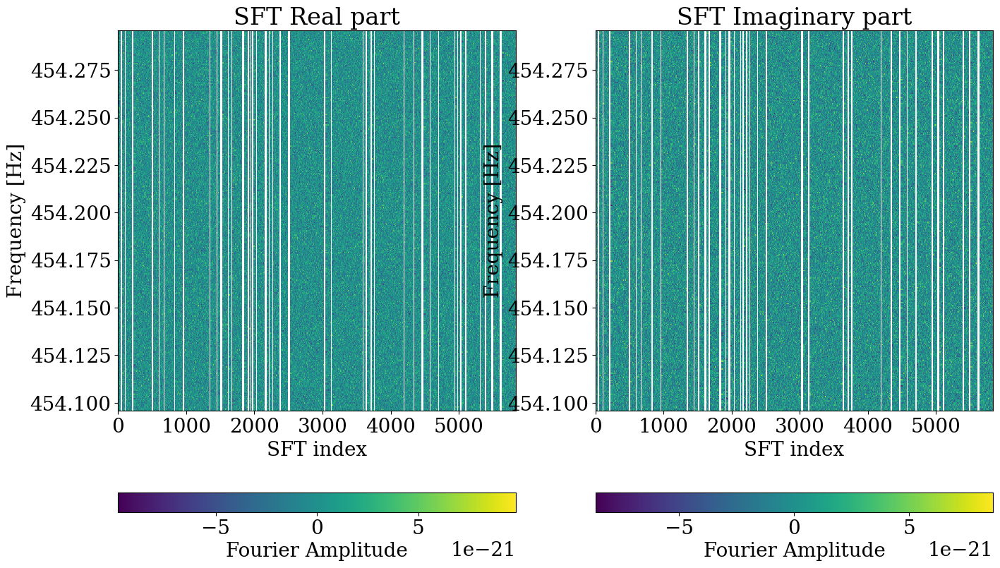

In [9]:
os.makedirs(f"{OUTDIR}/spec_image_sample", exist_ok=True)

h_paths = sorted(glob.glob(f"{OUTDIR}/*_gap.hdf5"))[:5]
for ii, h_path in enumerate(h_paths):
    file_id = Path(h_path).stem

    freq, h1_a, l1_a, h1_t, l1_t = load_hdf5(h_path)
    print(freq.shape)
    print(h1_a.shape, l1_a.shape)
    print(h1_t.shape, l1_t.shape)
    print("h1_t:", h1_t)
    print("l1_t:", l1_t)
    print("h1_t[0] - l1_t[0]:", h1_t[0] - l1_t[0])

    h1_ts_gaps = h1_t[1:] - h1_t[:-1] - 1800
    print("h1 sum gap:",  round(sum(h1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(h1_ts_gaps))

    l1_ts_gaps = l1_t[1:] - l1_t[:-1] - 1800
    print("l1 sum gap:",  round(sum(l1_ts_gaps) / (24*3600), 2) , "days")
    #print(list(l1_ts_gaps))

    #fig_h1, axs = tutorial_utils.plot_real_imag_spectrograms(h1_t, freq, h1_a)
    #fig_l1, axs = tutorial_utils.plot_real_imag_spectrograms(l1_t, freq, l1_a)
    fig_gap_h1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(h1_t, freq, h1_a, 1800)
    fig_gap_l1, axs = tutorial_utils.plot_real_imag_spectrograms_with_gaps(l1_t, freq, l1_a, 1800)
    
    #fig_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_h1.png")
    #fig_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_l1.png")
    fig_gap_h1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_h1.png")
    fig_gap_l1.savefig(f"{OUTDIR}/spec_image_sample/{file_id}_fig_gap_l1.png")